## Read .mat files as HDF
### Convert images to .png and write to file

In [1]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
import skimage

f = h5py.File('./info.mat','r')
print(list(f.keys()))
print(list(f['info'].keys()))
print(f['info']['camera'])
print(f['info']['sigma_raw'])

['#refs#', 'info']
['boundingboxes', 'camera', 'nlf', 'sigma_raw', 'sigma_srgb']
<HDF5 dataset "camera": shape (1, 50), type "|O">
<HDF5 dataset "sigma_raw": shape (1, 50), type "|O">


In [2]:
camera = f['/info/camera'].ref
a = [f[i] for i in f[camera][0,:]][0]
print(a.keys())
a[a['AsShotNeutral'].ref][0]

<KeysViewHDF5 ['AsShotNeutral', 'ColorMatrix1', 'ColorMatrix2', 'angle', 'baseISO', 'bayertype', 'blacklevel', 'debayerMatrices', 'gamma', 'pattern', 'type', 'whitelevel']>


array([0.4922])

In [9]:
f = h5py.File('images_srgb/0026.mat','r')

In [10]:
list(f.keys())

['InoisySRGB']

In [11]:
imdat = f['InoisySRGB']
imdat.shape

(3, 4636, 3468)

<Figure size 432x288 with 0 Axes>

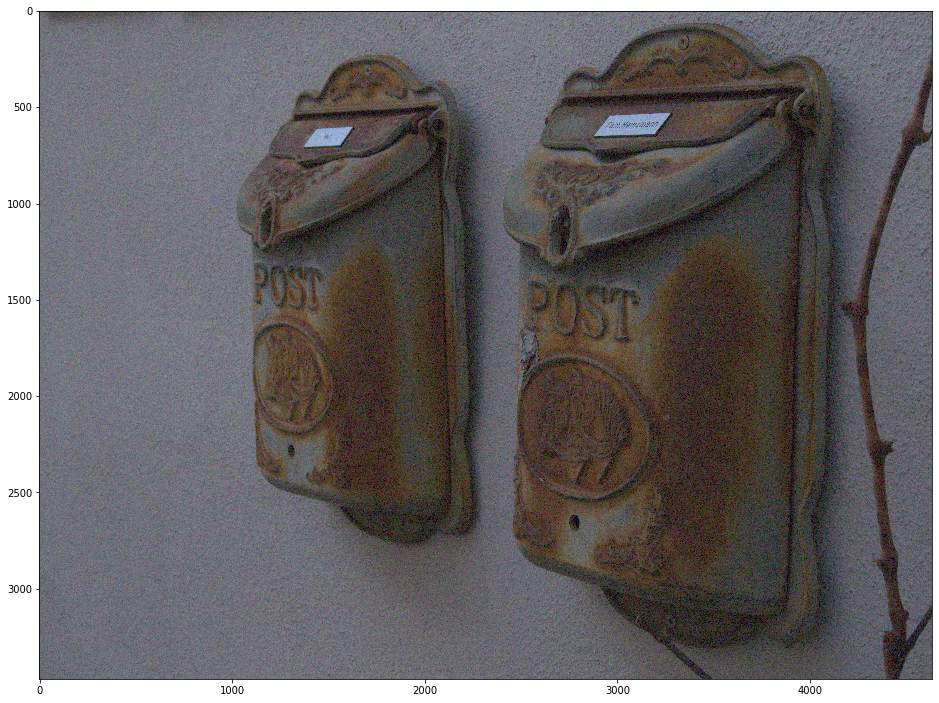

In [12]:
plt.figure()
imdat= np.swapaxes(imdat,0,2)
plt.figure(figsize=(16,18))
plt.imshow(imdat)
plt.show()

In [166]:
image.shape

(4916, 7358, 3)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

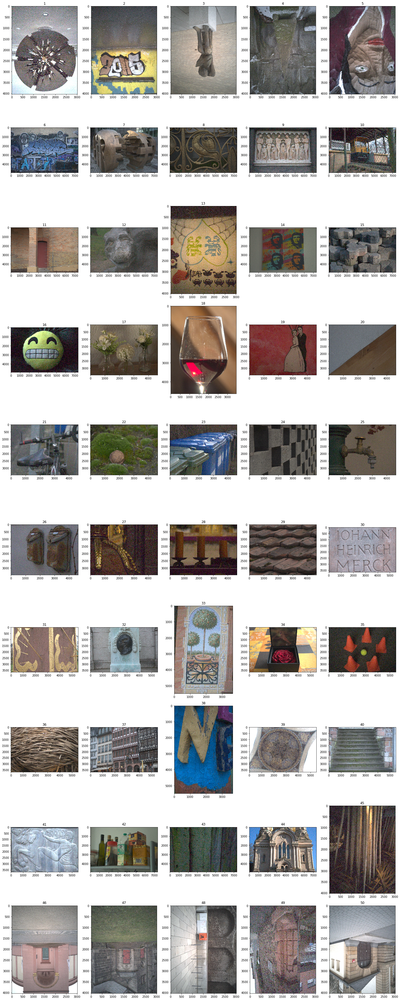

In [168]:
plt.figure(figsize=(20,50))
for ind in range(50):
    f = h5py.File('images_srgb/00%02d.mat' % (ind+1),'r')
    imdat = f['InoisySRGB']
    imdat= np.swapaxes(imdat,0,2)   # convert BGR to RGB
    skimage.io.imsave('images_srgb_png/00%02d.png' % (ind+1), imdat)  # save as PNG
    image = skimage.io.imread('images_srgb_png/00%02d.png' % (ind+1)) # check PNG file
    plt.subplot(10,5,ind+1)
    plt.imshow(image)
    plt.title(f'{ind+1}')
plt.tight_layout()
